Uses the environment "velocity".

In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank
import pygam
import gseapy

In [2]:
# Read input file

working_directory = "RNA Sequencing Data/"

# Use adata from velocity analysis
adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

print(adata)

AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_sigma_1', 'fit_sigma_2'
    uns: 'log1p', 'neighbors', 'pca', 'sample_colors', 'sde_velocity_graph', 'sde_velocity_graph_neg', 'sde_velocity_params'
    obsm: 'X_fdl', 'X_pca', 'X_umap', 'sde_velocity_fdl'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'pred_s', 'pred_u', 'sde_velocity', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'


In [3]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [4]:
# Create velocity kernel

velocity_kernel = cellrank.kernels.VelocityKernel(adata, vkey="sde_velocity")
velocity_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

  0%|          | 0/12791 [00:00<?, ?cell/s]

VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344]

In [5]:
# Create kernel based on latent time

latent_time_kernel = cellrank.kernels.PseudotimeKernel(adata, time_key = "latent_time")
latent_time_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [6]:
# Kernel based on gene expression similarity

# Neigborhood calculation is based on 30 pcs, 30 neighbors
print(adata.uns["neighbors"])

connectivity_kernel = cellrank.kernels.ConnectivityKernel(adata)
connectivity_kernel.compute_transition_matrix()

{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 30, 'n_pcs': 30, 'random_state': 0}}


ConnectivityKernel[n=12791, dnorm=True, key='connectivities']

In [7]:
# Combine all three kernels

combined_kernel = 0.4*velocity_kernel + 0.4*latent_time_kernel + 0.2*connectivity_kernel
combined_kernel.compute_transition_matrix()

(0.4 * VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344] + 0.4 * PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3] + 0.2 * ConnectivityKernel[n=12791, dnorm=True, key='connectivities'])

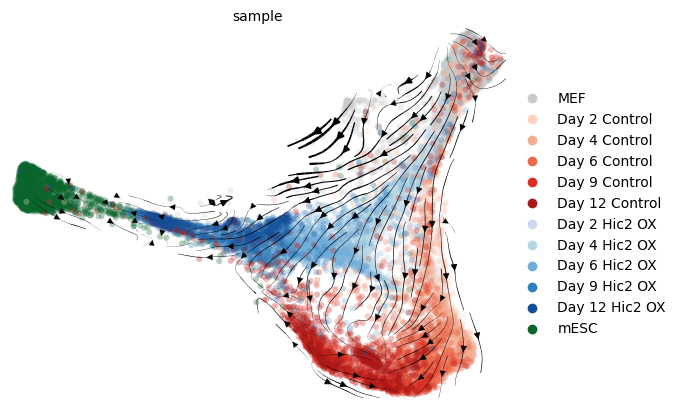

In [8]:
# Plot kernel vector field

combined_kernel.plot_projection(basis="fdl", color="sample", legend_loc="right margin")

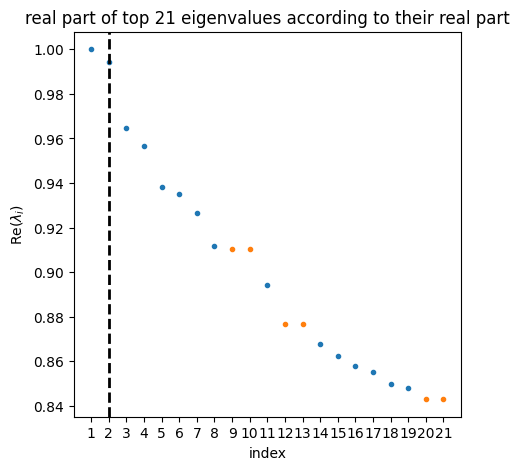

In [9]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.compute_schur()
estimator.plot_spectrum(real_only=True)

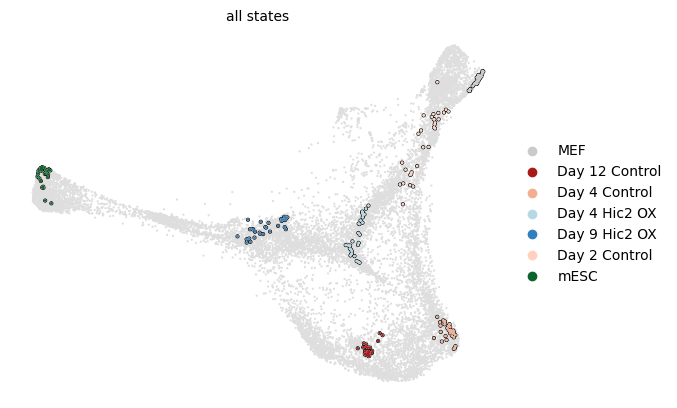

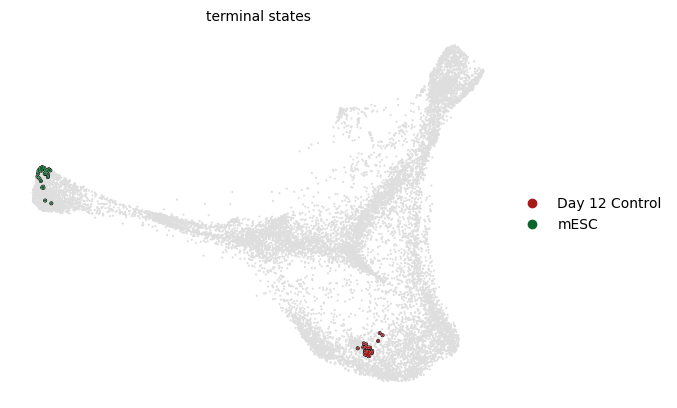

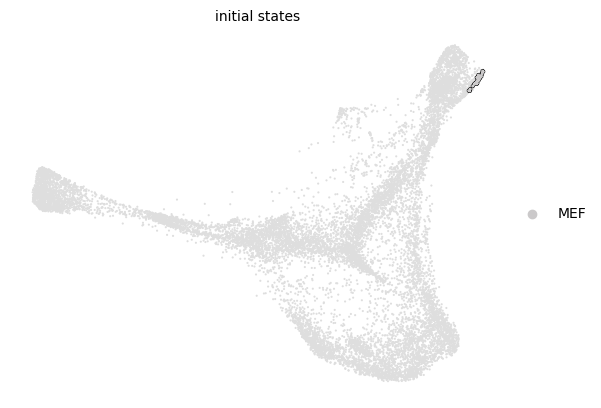

In [10]:
# Find 7 macrostates
estimator.compute_macrostates(n_states=7, cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

In [11]:
# Plot stability values. These are used to find terminal states with method="stability" and show that Day 4 control and Day 9 Hic2 OX are metastable

stability_values = estimator.coarse_T.values.diagonal()

stability_df = pandas.DataFrame({
    "Macrostate": macrostates,
    "Stability": stability_values
}).sort_values("Stability", ascending=False)

print(stability_df)

       Macrostate  Stability
6            mESC   0.996307
1  Day 12 Control   0.976904
2   Day 4 Control   0.972855
4   Day 9 Hic2 OX   0.964469
3   Day 4 Hic2 OX   0.940375
0             MEF   0.936240
5   Day 2 Control   0.928947


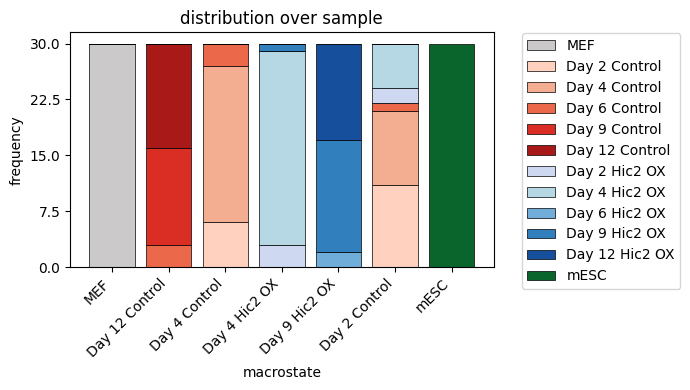

In [12]:
estimator.plot_macrostate_composition(key="sample", figsize=(7, 4))

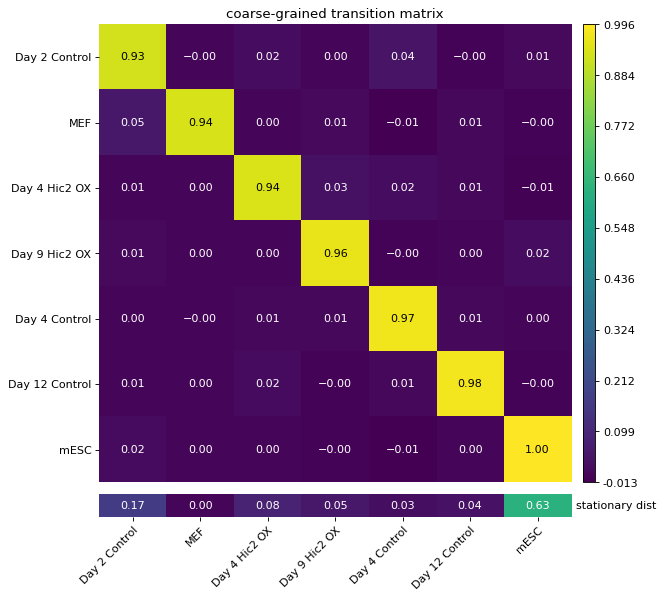

In [13]:
estimator.plot_coarse_T()

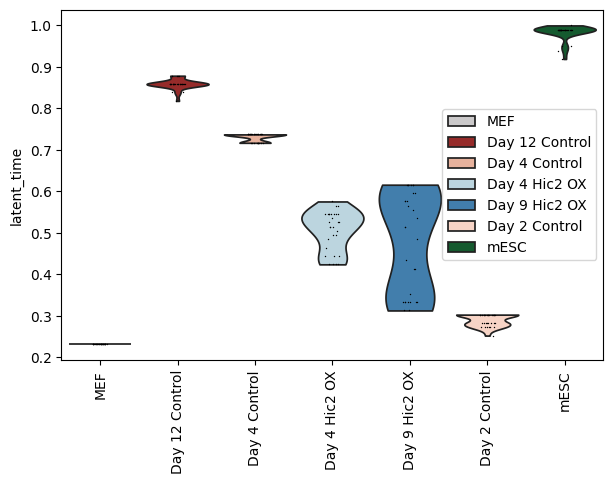

In [14]:
# Show macrostates in latent time

scanpy.pl.violin(adata, keys=["latent_time"], groupby="macrostates_fwd", rotation=90)

  0%|          | 0/2 [00:00<?, ?/s]

  0%|          | 0/2 [00:00<?, ?/s]

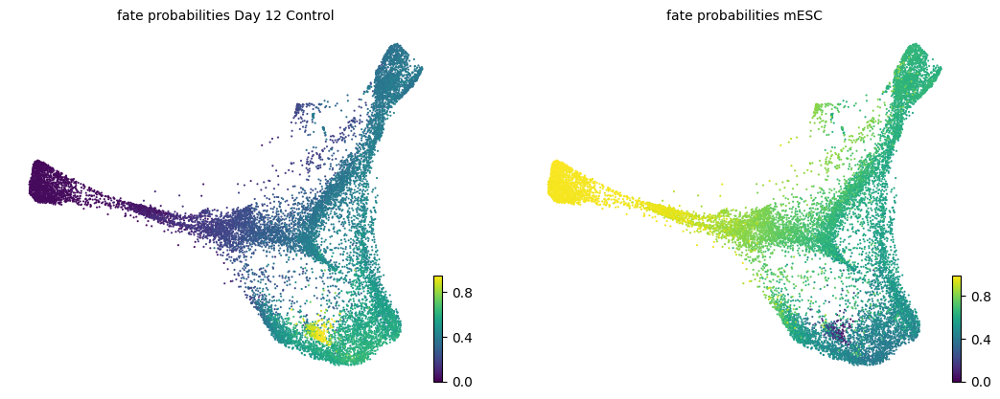

In [15]:
# Estimate fate probabilities

estimator.compute_fate_probabilities()

# Add fate probabilities to adata
for terminal_state in terminal_states:
    adata.obs[f"fate_probabilities_{terminal_state}"] = estimator.fate_probabilities[terminal_state].X.flatten()
estimator.compute_fate_probabilities()
estimator.plot_fate_probabilities(same_plot=False, basis="fdl")

# Setup for plotting gene trends

In [59]:
# Function for plotting trends independent of trajectory

def plot_grouped_gene_trend(adata, genes, group_key="group", time_key="latent_time", layer="Ms", groups=None, columns=4, figure_width=14, plot_height=4):
    """
    Plots smoothed gene expression using generalized additive models (GAMs).
    This provides true smooth local regression with confidence intervals.
    """

    number_of_genes = len(genes)
    number_of_columns = min(columns, number_of_genes)
    
    # Calculate rows
    rows = (number_of_genes + number_of_columns - 1) // number_of_columns
    
    figure, axes = pyplot.subplots(rows, number_of_columns)
    figure.set_figwidth(figure_width)
    figure.set_figheight(plot_height * rows)

    # Handle single gene case (axes is not an array) and 1D array case
    if number_of_genes == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    # Define colors for groups
    unique_groups = adata.obs[group_key].unique()
    if f"{group_key}_colors" in adata.uns_keys():
        palette = adata.uns[f"{group_key}_colors"]
        color_map = dict(zip(unique_groups, palette))
    else:
        palette = seaborn.color_palette("tab10", n_colors=len(unique_groups))
        color_map = dict(zip(unique_groups, palette))


    for gene_index, gene in enumerate(genes):
        axis = axes_flat[gene_index]
        
        # Fetch expression data
        expr_data = adata[:, gene].layers[layer]
        if hasattr(expr_data, "toarray"):
            expr_data = expr_data.toarray()
        expr_data = expr_data.flatten()
        
        # Create DataFrame
        df = pandas.DataFrame({
            "Latent Time": adata.obs[time_key],
            "Expression": expr_data,
            "Group": adata.obs[group_key]
        })
        
        # Determine which groups to plot
        if groups is None:
            # If no specific list, plot all groups found in the data
            plot_groups = df["Group"].unique()
        else:
            plot_groups = groups

        # Loop through each group and fit a GAM
        for group in plot_groups:
            group_data = df[df["Group"] == group]
            color = color_map[group]
            
            # Skip empty groups
            if len(group_data) < 10:
                continue

            # Prepare X and y for pygam (X must be 2D array)
            X = group_data["Latent Time"].values.reshape(-1, 1)
            y = group_data["Expression"].values
            
            # Fit LinearGAM using a Spline term s(0) and 6 splines
            gam = pygam.LinearGAM(pygam.s(0, n_splines=6)).fit(X, y)
            
            # Generate a smooth grid for plotting lines
            X_grid = numpy.linspace(X.min(), X.max(), 500)
            
            # Predict values and confidence intervals
            y_pred = gam.predict(X_grid)
            confidence_intervals = gam.confidence_intervals(X_grid, width=0.95)
            
            # Plot Line
            axis.plot(X_grid, y_pred, label=group, color=color, linewidth=3)
            
            # Plot Confidence Interval (Fill)
            axis.fill_between(
                X_grid, 
                confidence_intervals[:, 0], 
                confidence_intervals[:, 1], 
                color=color, 
                alpha=0.2
            )

        axis.set_title(f"{gene} expression")
        axis.set_xlabel("Latent Time")
        
        # Add legend to the first plot
        if gene_index == 0:
            axis.legend()

    # Clean up empty subplots
    for i in range(number_of_genes, len(axes_flat)):
        axes_flat[i].axis('off')

    pyplot.tight_layout()
    pyplot.show()

# Define colors for all three groups

group_colors = [
    "#cbc9ca",
    "#0a652c",
    "#da2e24",
    "#3180bd",
]

adata.uns["group_colors"] = group_colors

control_indices = adata.obs["group"] == "control"
hic2_indices = adata.obs["group"] == "Hic2"
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")

corr_column = terminal_states[-1]+"_corr"

# Drivers in all control and Hic2 cells

In [17]:
reprogramming_groups = ["Hic2", "control"]

# Find driver genes for all terminal states
driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters=reprogramming_groups
)

In [58]:
# Drivers for dead end
driver_df.sort_values(corr_column, ascending=True).head(30)[[corr_column]]

,mESC_corr
gene_names,
Cd24a,-0.666161
Lmo1,-0.591417
Crip2,-0.579637
Ctsz,-0.574908
Lgals7,-0.573641
Rtn4r,-0.570927
Tmem238,-0.536205
S100a16,-0.525246
Pcolce2,-0.525131


In [19]:
# Drivers for mESCs
driver_df.sort_values(corr_column, ascending=False).head(30)[[corr_column]]

,mESC_corr
gene_names,
Rbpms2,0.602228
Mdk,0.588931
Fbxo15,0.588022
Folr1,0.579031
Utf1,0.577003
Apoc1,0.566876
Dnmt3l,0.561188
Gdf3,0.558953
Klhl13,0.558729


In [20]:
# How genes of interest correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Ovol1", "Atf3", "Hic2", "Sall4", "Shisa8", "Myc", "Cdkn1a"]

driver_df.loc[genes_of_interest][[corr_column]]

,mESC_corr
gene_names,
Krtdap,-0.108541
Krt8,-0.440561
Krt14,-0.343188
Nanog,0.309878
Tet1,0.484521
Cdh1,-0.308703
Ovol1,-0.443452
Atf3,-0.337882
Hic2,0.185105


In [21]:
# How stem cell drivers correlate with fate probability

stem_cell_tfs = ['Klf2', 'Mycn', 'Rest', 'Tcf7l1', 'Tcf7l2', 'Tfcp2l1', 'Tsc22d1', 'Zfp42', 'Zic2']

driver_df.loc[stem_cell_tfs][[corr_column]].sort_values(corr_column, ascending=False)

,mESC_corr
gene_names,
Zfp42,0.467972
Tcf7l1,0.431661
Rest,0.388094
Klf2,0.369637
Mycn,0.331331
Zic2,0.315998
Tfcp2l1,0.301657
Tsc22d1,0.291696
Tcf7l2,0.282163


In [22]:
# How dead end drivers correlate with fate probability

dead_end_tfs = ['Hmgb3', 'Hoxa7', 'Ovol1', 'Tlx2', 'Zbtb7c']

driver_df.loc[dead_end_tfs][[corr_column]].sort_values(corr_column)

,mESC_corr
gene_names,
Tlx2,-0.479133
Ovol1,-0.443452
Zbtb7c,-0.357488
Hmgb3,-0.252703
Hoxa7,-0.217468


## Trends for identified control drivers

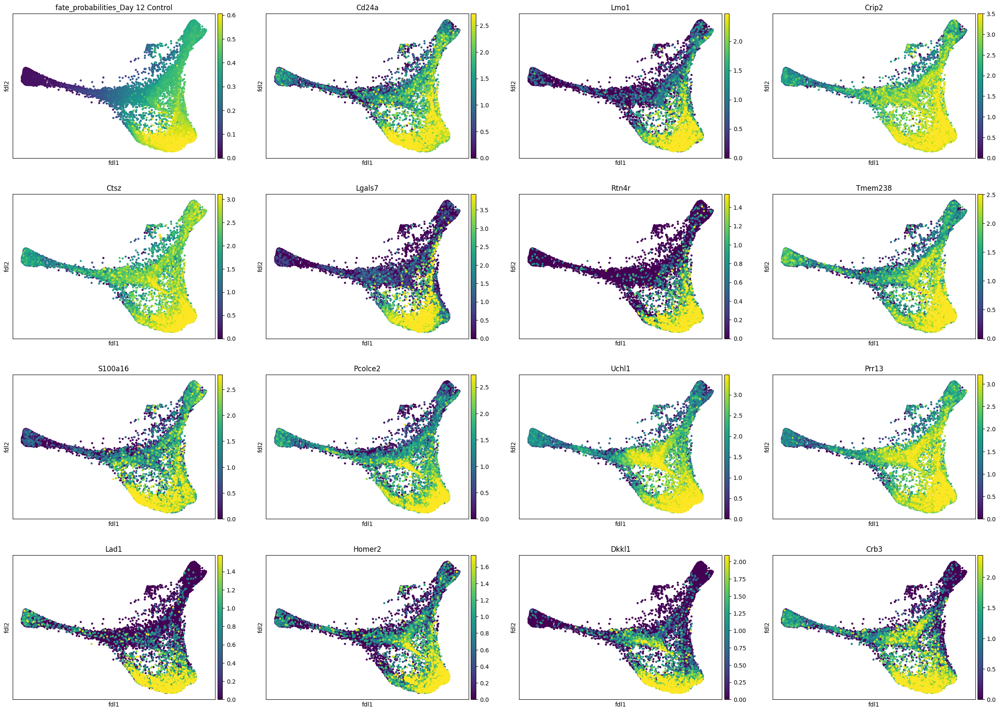

In [23]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:15]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

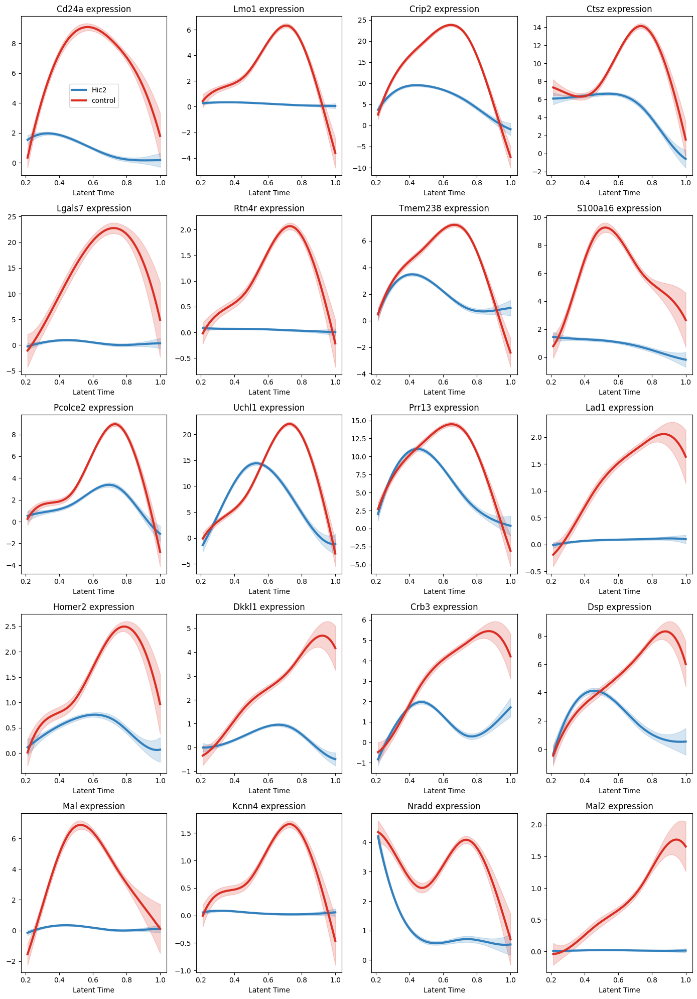

In [24]:
# Expression of drivers
dead_end_drivers = driver_df.sort_values(f"Day 12 Control_corr", ascending=False).head(20).index

plot_grouped_gene_trend(
    adata, 
    dead_end_drivers, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


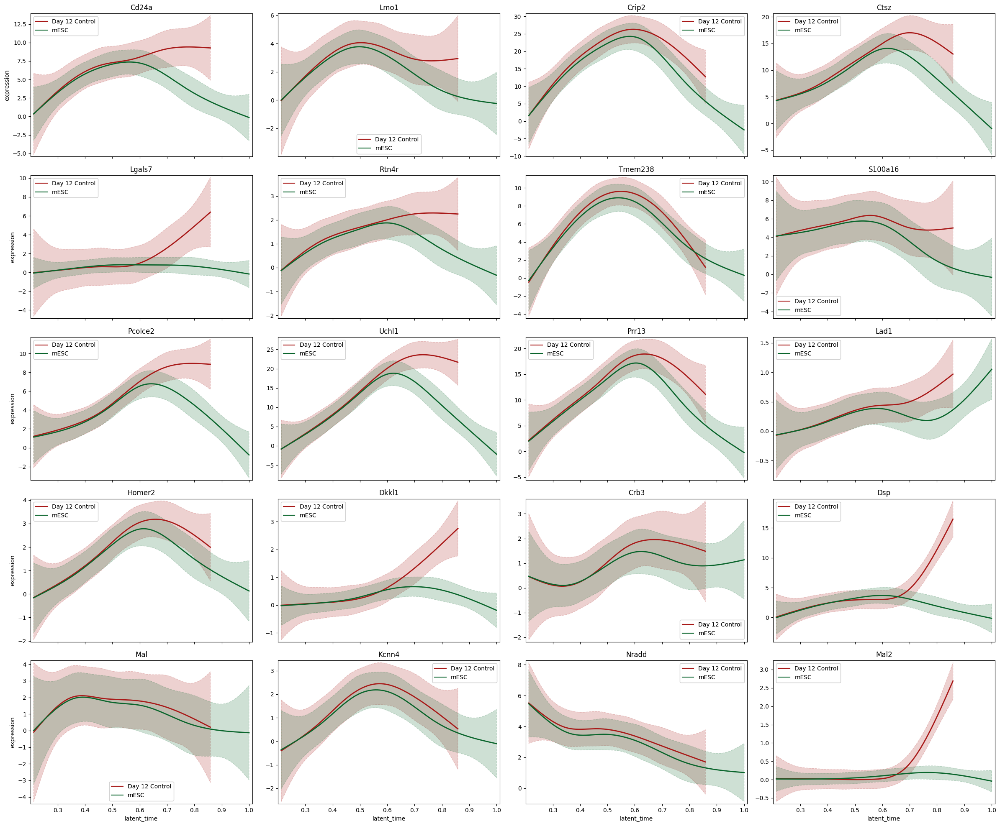

In [25]:
# Expression trends by trajectory

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=dead_end_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


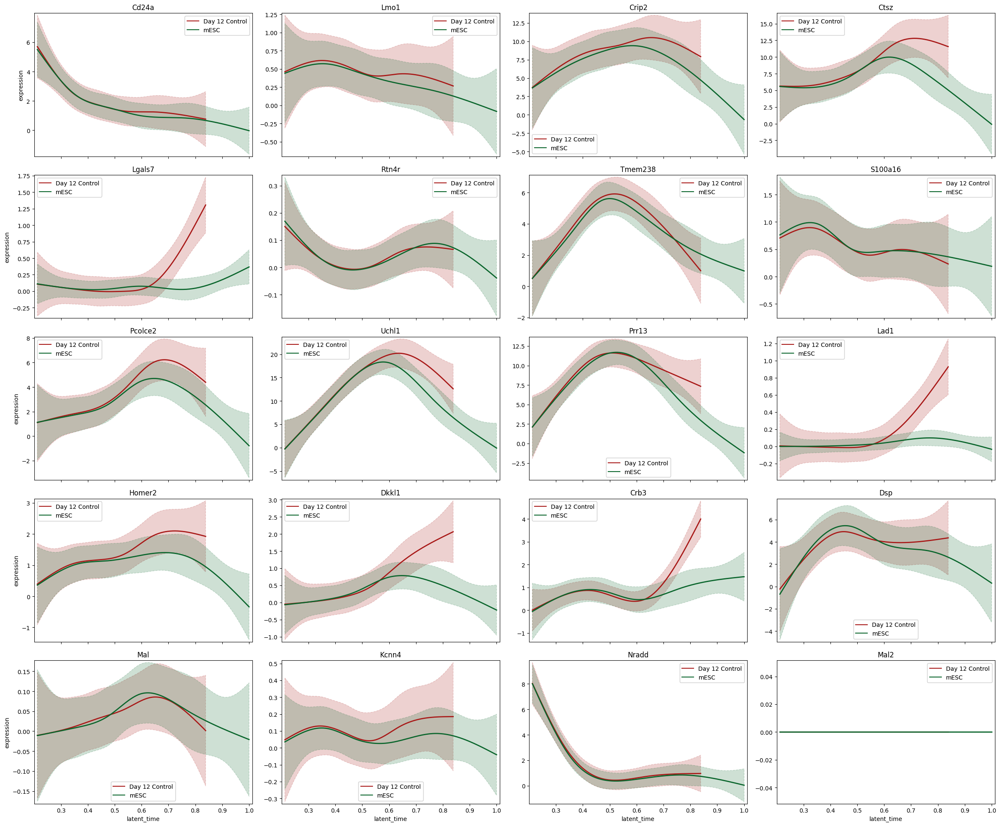

In [26]:
# Expression trends by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=dead_end_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


## Trends for identified reprogramming drivers

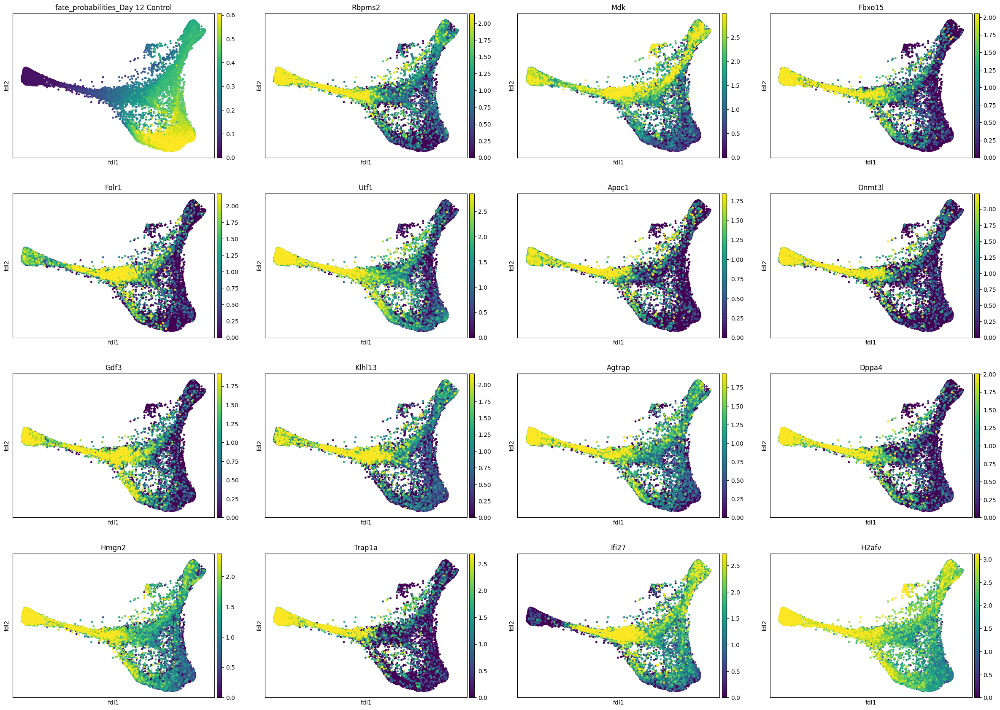

In [27]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=True).index[:15]),
    color_map="viridis",
    s=50,
    ncols=4,
    vmax="p96",
)

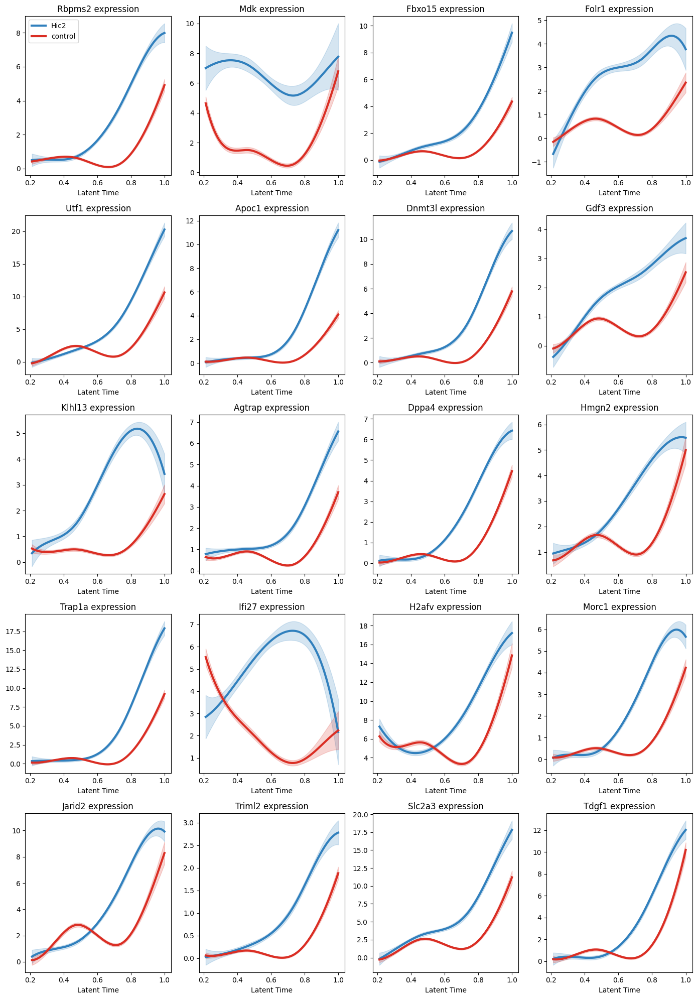

In [28]:
# Expression of drivers
stem_cell_drivers = driver_df.sort_values(f"Day 12 Control_corr", ascending=True).head(20).index

plot_grouped_gene_trend(
    adata, 
    stem_cell_drivers, 
    group_key="group", 
    layer="spliced", 
    groups=["Hic2", "control"]
)

  0%|          | 0/20 [00:00<?, ?gene/s]

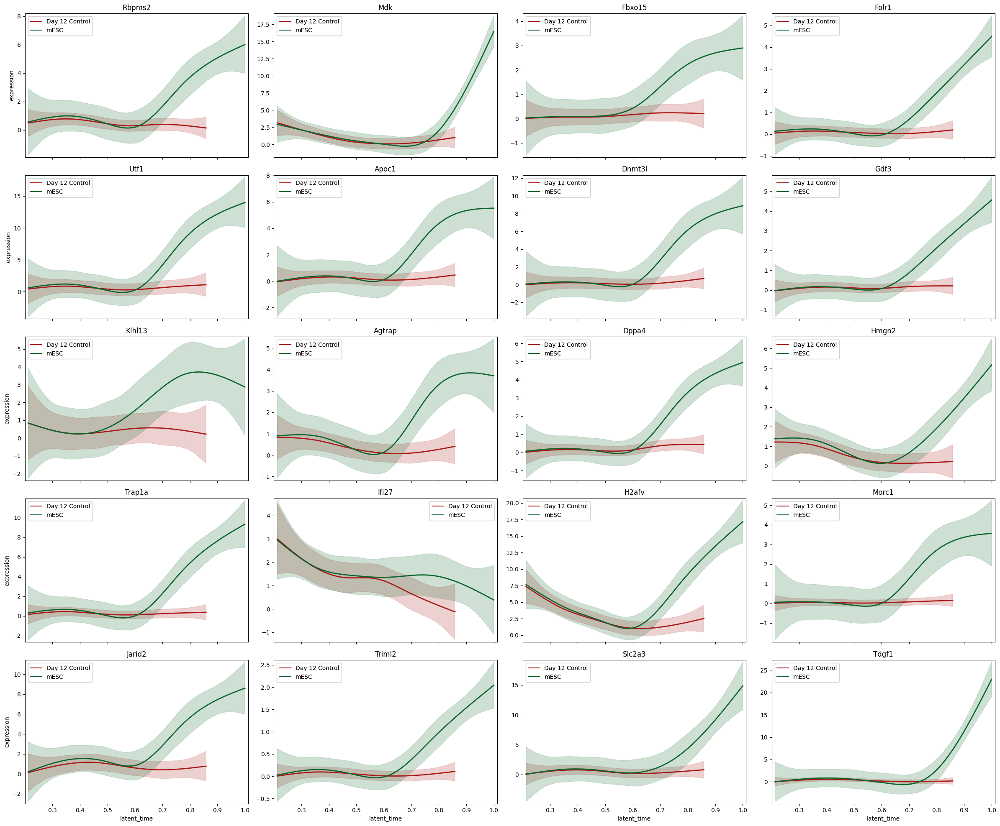

In [29]:
# Expression trends by trajectory

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=stem_cell_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/20 [00:00<?, ?gene/s]

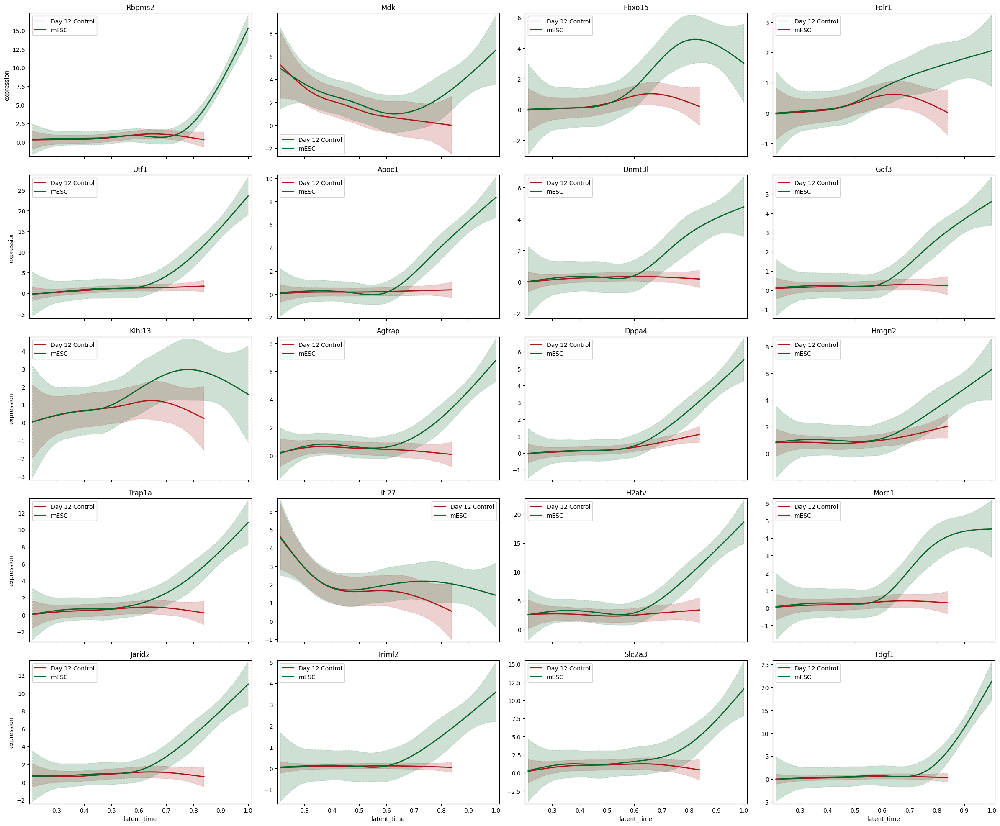

In [30]:
# Expression trends by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=stem_cell_drivers,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

# Early drivers

In [60]:
latent_time_cutoff = 0.7

reprogramming_groups = ["Hic2", "control"]
control_indices = adata.obs["group"] == "control"
hic2_indices = adata.obs["group"] == "Hic2"

# Create a variable for early cells
early_array = numpy.full(adata.shape[0], "Late", dtype=object)
early_array[adata.obs["group"].isin(reprogramming_groups) & (adata.obs["latent_time"] < latent_time_cutoff)] = "Early"
adata.obs["early_or_late"] = pandas.Series(early_array, index=adata.obs.index).astype("category")

In [61]:
# Find driver genes for all terminal states

early_driver_df = estimator.compute_lineage_drivers(
    cluster_key="early_or_late", clusters="Early"
)

In [62]:
# Dead end drivers
combined_df = early_driver_df[[corr_column]].rename(columns={corr_column: "Early correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Early correlation", ascending=True).head(30)

,Early correlation,Full correlation
gene_names,,
Cd24a,-0.661327,-0.666161
Lmo1,-0.594814,-0.591417
Tmem238,-0.565221,-0.536205
Mal,-0.552312,-0.487651
Lgals7,-0.539821,-0.573641
Rtn4r,-0.534904,-0.570927
S100a16,-0.519256,-0.525246
Crip2,-0.507393,-0.579637
Tlx2,-0.496697,-0.479133


In [63]:
# Stem cell drivers
combined_df.sort_values("Early correlation", ascending=False).head(30)

,Early correlation,Full correlation
gene_names,,
Mdk,0.604832,0.588931
Folr1,0.604671,0.579031
Car2,0.557678,0.471406
Klhl13,0.539315,0.558729
Gdf3,0.530782,0.558953
Fgfbp1,0.526394,0.481486
Fbxo15,0.522104,0.588022
Ifi27,0.516173,0.525646
Utf1,0.493817,0.577003


In [64]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Early correlation")

,Early correlation,Full correlation
gene_names,,
Tlx2,-0.496697,-0.479133
Ovol1,-0.387979,-0.443452
Hmgb3,-0.291225,-0.252703
Zbtb7c,-0.274898,-0.357488
Hoxa7,-0.196160,-0.217468
Zic2,0.180079,0.315998
Klf2,0.181509,0.369637
Tsc22d1,0.184488,0.291696
Mycn,0.205365,0.331331


# Late drivers

In [65]:
# Find driver genes for all terminal states

late_driver_df = estimator.compute_lineage_drivers(
    cluster_key="early_or_late", clusters="Late"
)

In [66]:
# Dead end drivers
combined_df = late_driver_df[[corr_column]].rename(columns={corr_column: "Late correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Late correlation", ascending=True).head(30)

,Late correlation,Full correlation
gene_names,,
B2m,-0.782764,-0.442145
Ctsz,-0.744971,-0.574908
Prr13,-0.740083,-0.516316
Pcolce,-0.727160,-0.390378
H2-D1,-0.725247,-0.255440
Krt8,-0.716009,-0.440561
Cd24a,-0.710608,-0.666161
Emp3,-0.697328,-0.362163
Gsto1,-0.697248,-0.475513


In [67]:
combined_df.sort_values("Late correlation", ascending=False).head(30)

,Late correlation,Full correlation
gene_names,,
Dppa5a,0.833114,0.492546
Tdgf1,0.791143,0.494839
Ifitm1,0.789843,0.395479
Trap1a,0.777983,0.543612
Klf2,0.758791,0.369637
Zfp42,0.757021,0.467972
Tet1,0.756022,0.484521
H2afv,0.754168,0.524962
Utf1,0.739445,0.577003


In [68]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Late correlation")

,Late correlation,Full correlation
gene_names,,
Tlx2,-0.554099,-0.479133
Zbtb7c,-0.524118,-0.357488
Ovol1,-0.506482,-0.443452
Hoxa7,-0.339256,-0.217468
Hmgb3,-0.227214,-0.252703
Tcf7l2,-0.181846,0.282163
Zic2,0.250486,0.315998
Tsc22d1,0.353680,0.291696
Tcf7l1,0.459919,0.431661


# Drivers in control group only

In [69]:
# Find driver genes for all terminal states

control_driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="control"
)

In [70]:
# Dead end drivers
combined_df = control_driver_df[[corr_column]].rename(columns={corr_column: "Control correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Control correlation", ascending=True).head(30)

,Control correlation,Full correlation
gene_names,,
Uchl1,-0.566976,-0.522823
Ctsz,-0.512846,-0.574908
Crb3,-0.498825,-0.490890
Dsp,-0.486980,-0.490449
Shisa8,-0.479944,-0.451970
Dkkl1,-0.471419,-0.500613
Ifi30,-0.470296,-0.469271
Krt8,-0.460268,-0.440561
Perp,-0.456014,-0.460188


In [71]:
# Stem cell drivers
combined_df.sort_values("Control correlation", ascending=False).head(30)

,Control correlation,Full correlation
gene_names,,
Dppa5a,0.558899,0.492546
Rbpms2,0.543951,0.602228
Fn1,0.541413,0.426157
Sparc,0.536626,0.455673
Apoc1,0.527108,0.566876
Tdgf1,0.522735,0.494839
Trap1a,0.521554,0.543612
Agtrap,0.509073,0.557106
Utf1,0.508860,0.577003


In [72]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Control correlation")

,Control correlation,Full correlation
gene_names,,
Ovol1,-0.364260,-0.443452
Tlx2,-0.336176,-0.479133
Zbtb7c,-0.267514,-0.357488
Hoxa7,-0.071838,-0.217468
Hmgb3,-0.038518,-0.252703
Tcf7l2,0.153679,0.282163
Zic2,0.256463,0.315998
Tfcp2l1,0.270377,0.301657
Tsc22d1,0.309490,0.291696


# Drivers in Hic2 only

In [73]:
# Find driver genes for all terminal states

hic2_driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters="Hic2"
)

In [74]:
# Dead end drivers
combined_df = hic2_driver_df[[corr_column]].rename(columns={corr_column: "Hic2 correlation"})
combined_df["Full correlation"] = driver_df[[corr_column]]
combined_df.sort_values("Hic2 correlation", ascending=True).head(30)

,Hic2 correlation,Full correlation
gene_names,,
Anxa5,-0.714810,-0.303736
Lmna,-0.701386,-0.384925
B2m,-0.699810,-0.442145
Ccnd2,-0.675295,-0.472549
S100a6,-0.664711,-0.119375
Abracl,-0.654750,-0.171320
Emp3,-0.654220,-0.362163
Vim,-0.649009,0.213615
Esd,-0.647543,-0.263091


In [75]:
# Stem cell drivers
combined_df.sort_values("Hic2 correlation", ascending=False).head(30)

,Hic2 correlation,Full correlation
gene_names,,
Zfp42,0.690897,0.467972
Utf1,0.682165,0.577003
Apoc1,0.679625,0.566876
Fbxo15,0.676552,0.588022
Dppa4,0.673666,0.549051
Jarid2,0.662709,0.503923
Dnmt3l,0.661755,0.561188
Trap1a,0.659418,0.543612
Rbpms2,0.654720,0.602228


In [76]:
# ChipSeq-validated driver TFs
combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Hic2 correlation")

,Hic2 correlation,Full correlation
gene_names,,
Hoxa7,-0.276053,-0.217468
Tlx2,-0.164233,-0.479133
Hmgb3,-0.145575,-0.252703
Zbtb7c,-0.141075,-0.357488
Ovol1,-0.098093,-0.443452
Tcf7l2,0.182103,0.282163
Tsc22d1,0.209350,0.291696
Tcf7l1,0.345654,0.431661
Zic2,0.399770,0.315998


# Compare correlations in different groups

In [79]:
# Dead end drivers
combined_df = driver_df[[corr_column]].rename(columns={corr_column: "Full correlation"})
combined_df["Early correlation"] = early_driver_df[[corr_column]]
combined_df["Late correlation"] = late_driver_df[[corr_column]]
combined_df["Control correlation"] = control_driver_df[[corr_column]]
combined_df["Hic2 correlation"] = hic2_driver_df[[corr_column]]
combined_df.sort_values("Full correlation", ascending=True).head(50)

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Cd24a,-0.666161,-0.661327,-0.710608,-0.449259,-0.422708
Lmo1,-0.591417,-0.594814,-0.655518,-0.402147,-0.232217
Crip2,-0.579637,-0.507393,-0.647302,-0.393837,-0.451330
Ctsz,-0.574908,-0.431604,-0.744971,-0.512846,-0.496622
Lgals7,-0.573641,-0.539821,-0.662717,-0.424758,-0.076808
Rtn4r,-0.570927,-0.534904,-0.638425,-0.435112,-0.163407
Tmem238,-0.536205,-0.565221,-0.467942,-0.326848,-0.526506
S100a16,-0.525246,-0.519256,-0.684973,-0.287602,-0.229931
Pcolce2,-0.525131,-0.470822,-0.555475,-0.380660,-0.326826


In [80]:
# Stem cell drivers
combined_df.sort_values("Full correlation", ascending=False).head(50)

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Rbpms2,0.602228,0.481361,0.729209,0.543951,0.654720
Mdk,0.588931,0.604832,0.648704,0.469763,0.407259
Fbxo15,0.588022,0.522104,0.718641,0.482826,0.676552
Folr1,0.579031,0.604671,0.536012,0.433496,0.593723
Utf1,0.577003,0.493817,0.739445,0.508860,0.682165
Apoc1,0.566876,0.460315,0.603512,0.527108,0.679625
Dnmt3l,0.561188,0.467669,0.678680,0.491589,0.661755
Gdf3,0.558953,0.530782,0.664289,0.467477,0.594031
Klhl13,0.558729,0.539315,0.464772,0.382043,0.564215


# Expression trends for drivers identified with ChipSeq

In [81]:
# How ChipSeq target TFs correlate with fate probability in different groups

combined_df.loc[dead_end_tfs + stem_cell_tfs].sort_values("Full correlation")

,Full correlation,Early correlation,Late correlation,Control correlation,Hic2 correlation
gene_names,,,,,
Tlx2,-0.479133,-0.496697,-0.554099,-0.336176,-0.164233
Ovol1,-0.443452,-0.387979,-0.506482,-0.364260,-0.098093
Zbtb7c,-0.357488,-0.274898,-0.524118,-0.267514,-0.141075
Hmgb3,-0.252703,-0.291225,-0.227214,-0.038518,-0.145575
Hoxa7,-0.217468,-0.196160,-0.339256,-0.071838,-0.276053
Tcf7l2,0.282163,0.367884,-0.181846,0.153679,0.182103
Tsc22d1,0.291696,0.184488,0.353680,0.309490,0.209350
Tfcp2l1,0.301657,0.229247,0.608774,0.270377,0.466510
Zic2,0.315998,0.180079,0.250486,0.256463,0.399770


## Dead end drivers

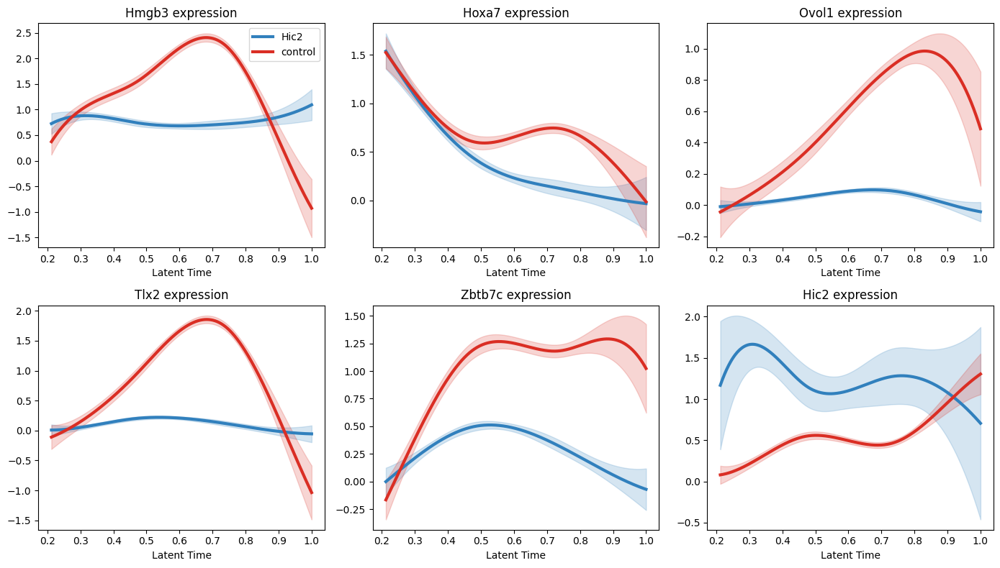

In [49]:
# Expression of dead end drivers

plot_grouped_gene_trend(
    adata,
    dead_end_tfs+["Hic2"],
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=3
)

  0%|          | 0/5 [00:00<?, ?gene/s]

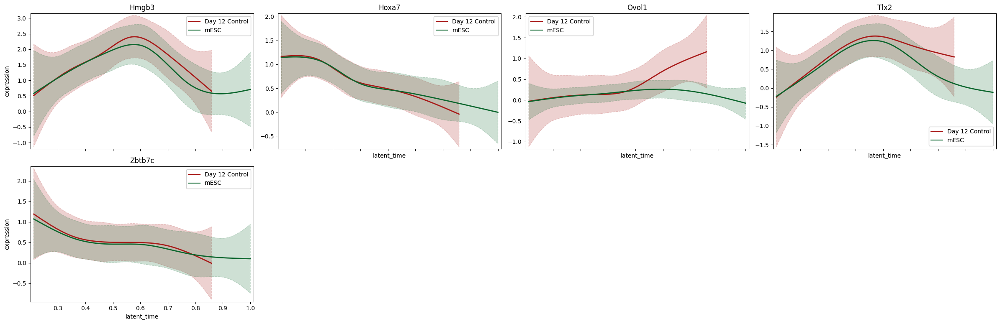

In [50]:
# Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=dead_end_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/5 [00:00<?, ?gene/s]

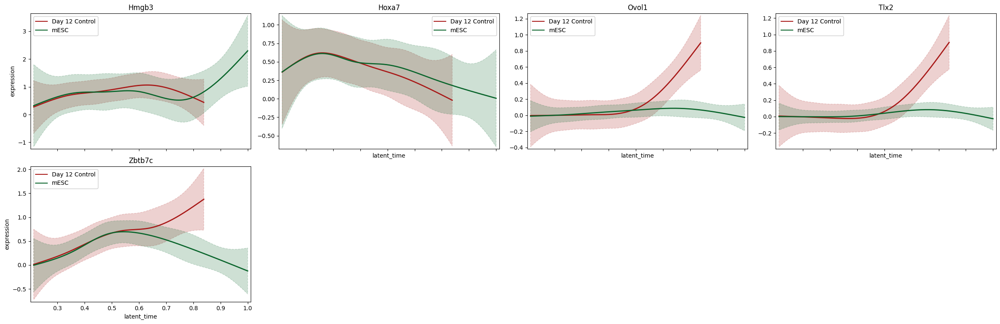

In [51]:
# Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=dead_end_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


## Stem cell drivers

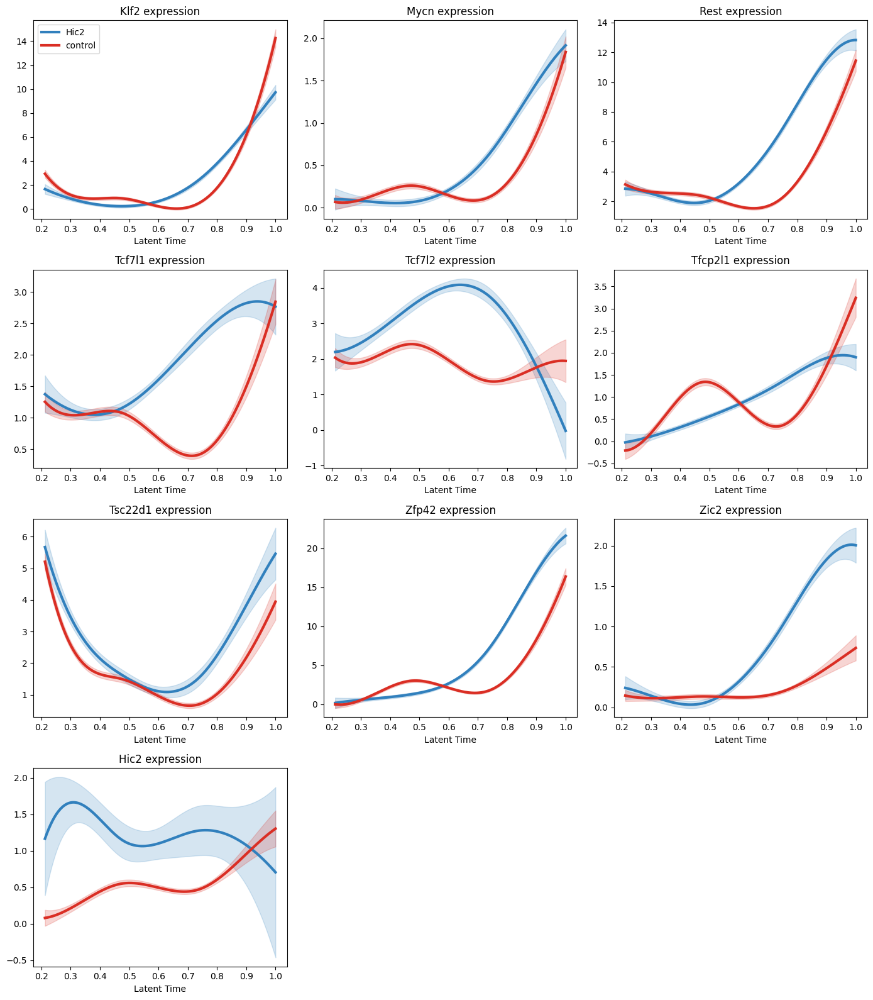

In [52]:
# Expression of reprogramming drivers

plot_grouped_gene_trend(
    adata,
    stem_cell_tfs+["Hic2"],
    group_key="group",
    layer="spliced",
    groups=["Hic2", "control"],
    columns=3
)

  0%|          | 0/9 [00:00<?, ?gene/s]

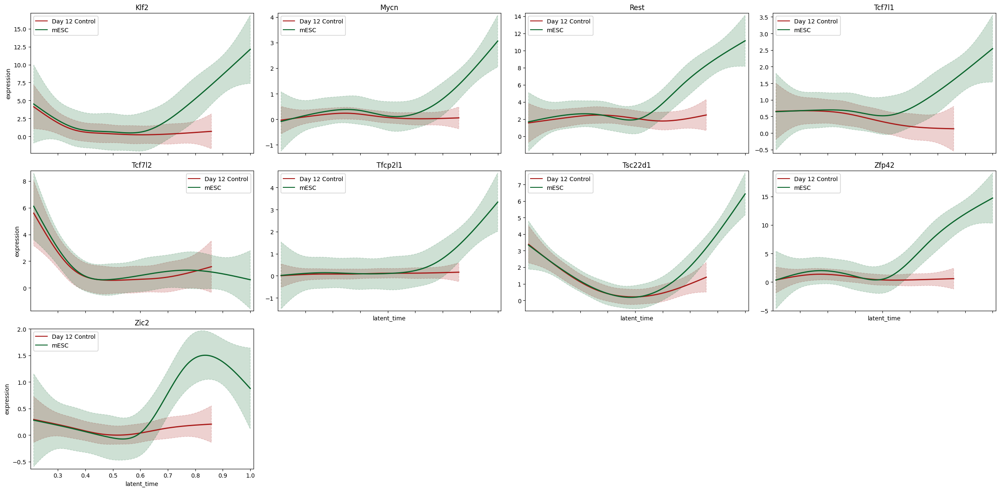

In [53]:
# Trends separated by trajectory, Hic2 and control

model = cellrank.models.GAMR(adata[reprogramming_group_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=stem_cell_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/9 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


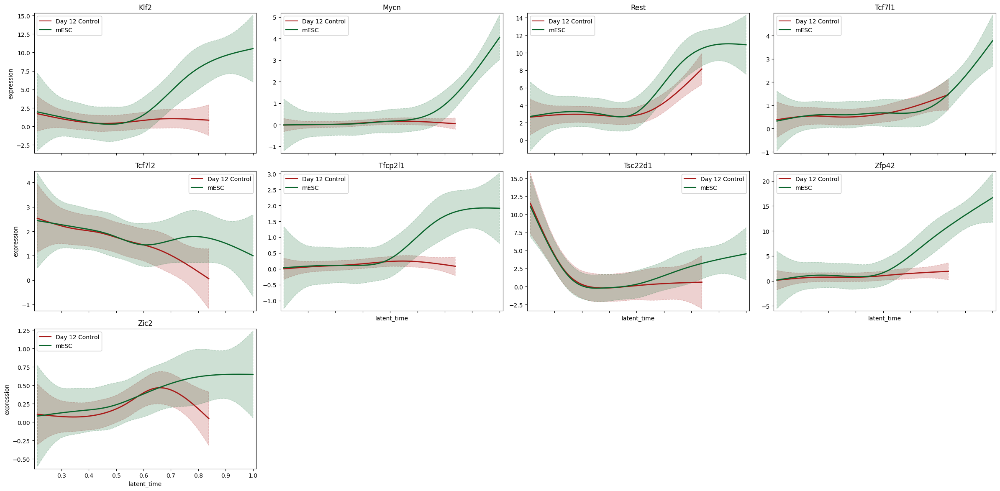

In [54]:
# Trends separated by trajectory, Hic2 only

model = cellrank.models.GAMR(adata[hic2_indices], n_knots=6, smoothing_penalty=10.0)

cellrank.pl.gene_trends(
    adata[hic2_indices],
    model=model,
    genes=stem_cell_tfs,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


# Save results

In [83]:
# Save results

base_name = "cellrank_version_5"

adata.write_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes.csv",
)

early_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_early.csv",
)

late_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_late.csv",
)

control_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_control.csv",
)

hic2_driver_df.to_csv(
    working_directory+f"{base_name}_driver_genes_hic2.csv",
)

combined_df.to_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
)